In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch import Tensor

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import itertools
from tqdm import tqdm

import snntorch as snn
from snntorch import surrogate
from snntorch import utils
import snntorch.functional as SF
import snntorch.spikeplot as splt

import sys
sys.path.append('../')
from toolbox import continous_and_generator, continous_or_generator, continous_xor_generator, forward_pass, set_seed

np.printoptions(precision=3)

batch_size = 32
beta = 0.9
threshold = 0.9
surrogate_gradient = surrogate.fast_sigmoid()
adam_betas = (0.9, 0.999)
rates = (0.9, 0.1)
epochs = 50
timesteps = 10
seed = 1
learning_rate = 1e-1
dataset = "continous_xor"

def accuracy(spk_out, targets):
    with torch.no_grad():
        _, idx = spk_out.sum(dim=0).max(1)
        accuracy = ((targets == idx).float()).mean().item()
    return accuracy

def f1(spk_out, targets):
    from sklearn import metrics
    with torch.no_grad():
        _, idx = spk_out.sum(dim=0).max(1)
        f1 = metrics.f1_score(targets.cpu().numpy(), idx.cpu().numpy())
        return f1

def predict_single(x, y, model, timesteps):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    spk, _ = forward_pass(model, torch.tensor([x, y], dtype=torch.float32).to(device), timesteps)
    _, idx = spk[:, None, :].sum(dim=0).max(1)
    return idx

def predict(data, model, timesteps):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    if data.get_device() == -1:
        spk, _ = forward_pass(model, torch.tensor(data, dtype=torch.float32).to(device), timesteps)
    else:
        spk, _ = forward_pass(model, data, timesteps)
    _, idx = spk.sum(dim=0).max(1)
    return idx

def get_decision_surface(model, timesteps):
    xdata = np.linspace(0, 1, 10)
    ydata = np.linspace(0, 1, 10)
    X, Y, Z = [], [], []
    for x, y in np.array(list(itertools.product(xdata, ydata))):
        X.append(x)
        Y.append(y)
        Z.append(predict_single(x, y, model, timesteps).item())

    X = np.array(X).reshape(10, 10)
    Y = np.array(Y).reshape(10, 10)
    Z = np.array(Z).reshape(10, 10)
    return Z

def plot_decision_surface(decision_surface):
    xdata = np.linspace(0, 1, 10)
    ydata = np.linspace(0, 1, 10)
    X, Y = [], []
    for x, y in np.array(list(itertools.product(xdata, ydata))):
        X.append(x)
        Y.append(y)
    X = np.array(X).reshape(10, 10)
    Y = np.array(Y).reshape(10, 10)
    plt.contourf(X, Y, decision_surface, cmap='plasma')
    plt.title("Decision surface", y=1.05)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.show()

def train(
    batch_size = batch_size,
    beta = beta,
    threshold = threshold,
    adam_betas = adam_betas,
    rates = rates,
    epochs = epochs,
    timesteps = timesteps,
    learning_rate = learning_rate,
    seed = seed,
    dataset = dataset
):
    set_seed(seed=seed)
    device = "cuda" if torch.cuda.is_available() else "cpu"

    if dataset == "continous_xor":
        train_loader = DataLoader(continous_xor_generator(size=700), 32)
        test_loader = DataLoader(continous_xor_generator(size=300), 32)
    elif dataset == "continous_and":
        train_loader = DataLoader(continous_and_generator(size=700), 32)
        test_loader = DataLoader(continous_and_generator(size=300), 32)
    elif dataset == "continous_or":
        train_loader = DataLoader(continous_or_generator(size=700), 32)
        test_loader = DataLoader(continous_or_generator(size=300), 32)

    net = nn.Sequential(
        nn.Linear(2, 8),
        snn.Leaky(beta=beta, threshold=threshold, spike_grad=surrogate_gradient, init_hidden=True),
        nn.Linear(8, 2),
        snn.Leaky(beta=beta, threshold=threshold, spike_grad=surrogate_gradient, init_hidden=True, output=True)
    ).to(device)

    optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate, betas=adam_betas)
    correct_rate, incorrect_rate = rates
    loss_fn = SF.mse_count_loss(correct_rate=correct_rate, incorrect_rate=incorrect_rate)

    seed_dict = {
        "surfaces": [],
        "stats": {
            "loss": {
                "train": [],
                "test": []
            },
            "accuracy": {
                "train": [],
                "test": []
            },
            "f1": {
                "train": [],
                "test": []
            }
        }
    }
    for epoch in range(epochs):
        with torch.no_grad():
            decision_surface = get_decision_surface(net, timesteps)
            seed_dict["surfaces"].append(decision_surface)

        train_epoch_loss_val, train_epoch_acc_val, train_epoch_f1_val = 0, 0, 0
        for i, (data, targets) in enumerate(iter(train_loader)):
            data = data.to(device)
            targets = targets.squeeze().to(device)
            net.train()
            spk_rec, mem_hist = forward_pass(net, data, timesteps) # forward-pass
            loss_val = loss_fn(spk_rec, targets) # loss calculation
            optimizer.zero_grad() # null gradients
            loss_val.backward() # calculate gradients
            optimizer.step() # update weights
            train_epoch_loss_val += loss_val.item()
            train_epoch_acc_val += accuracy(spk_rec, targets)
            train_epoch_f1_val += f1(spk_rec, targets)
        seed_dict["stats"]["loss"]["train"].append(train_epoch_loss_val/len(train_loader))
        seed_dict["stats"]["accuracy"]["train"].append(train_epoch_acc_val/len(train_loader))
        seed_dict["stats"]["f1"]["train"].append(train_epoch_f1_val/len(train_loader))
            # seed_dict["stats"]["loss"]["train"].append(loss_val.item())
            # seed_dict["stats"]["accuracy"]["train"].append(accuracy(spk_rec, targets))
            # seed_dict["stats"]["f1"]["train"].append(f1(spk_rec, targets))

        test_epoch_loss_val, test_epoch_acc_val, test_epoch_f1_val = 0, 0, 0
        for i, (data, targets) in enumerate(iter(test_loader)):
            data = data.to(device)
            targets = targets.squeeze().to(device)

            net.eval()
            spk_rec, mem_hist = forward_pass(net, data, timesteps)
            loss_val = loss_fn(spk_rec, targets)
            test_epoch_loss_val += loss_val.item()
            test_epoch_acc_val += accuracy(spk_rec, targets)
            test_epoch_f1_val += f1(spk_rec, targets)
        seed_dict["stats"]["loss"]["test"].append(test_epoch_loss_val/len(test_loader))
        seed_dict["stats"]["accuracy"]["test"].append(test_epoch_acc_val/len(test_loader))
        seed_dict["stats"]["f1"]["test"].append(test_epoch_f1_val/len(test_loader))
        # seed_dict["stats"]["loss"]["test"].append(loss_val.item())
        # seed_dict["stats"]["accuracy"]["test"].append(accuracy(spk_rec, targets))
        # seed_dict["stats"]["f1"]["test"].append(f1(spk_rec, targets))
    return seed_dict

In [11]:
def plot_stats(seeds_dict, stat):
    import matplotlib.ticker as ticker
    seeds = list(seeds_dict.keys())
    n_seeds = len(seeds)
    all_train_loss = [seeds_dict[seed]["stats"][stat]["train"] for seed in seeds_dict]
    all_test_loss = [seeds_dict[seed]["stats"][stat]["test"] for seed in seeds_dict]

    fig, ax = plt.subplots(2, 2, figsize=(30, 12))
    ax = ax.flatten()

    ax0 = sns.boxplot(all_train_loss, ax=ax[0])
    ax0.set(xlabel="seed", ylabel=f"{stat}", title=f"Train {stat}", xticklabels=seeds)
    ax1 = sns.boxplot(all_test_loss, ax=ax[1])
    ax1.set(xlabel="Seed", ylabel=f"{stat}", title=f"Test {stat}", xticklabels=seeds)
    ax2 = sns.lineplot(all_train_loss, ax=ax[2], legend=False)
    ax2.set(xlabel="Epochs", ylabel=f"{stat}", title=f"Train {stat}")
    ax3 = sns.lineplot(all_test_loss, ax=ax[3], legend=True)
    ax3.set(xlabel="Epochs", ylabel=f"{stat}", title=f"Test {stat}")

    handles, labels = ax3.get_legend_handles_labels()
    ax3.get_legend().remove()
    fig.legend(handles, np.arange(1, n_seeds, 1), loc='center left', ncol=1, bbox_to_anchor=(1.04, 0.5), title="Seeds")

    formatter = ticker.ScalarFormatter()
    formatter.set_scientific(False)
    for axis in [ax0, ax1]:
        axis.set_yscale('log')
        axis.set_yticks([0.001, 0.01, 0.1, 1, 10])
        axis.yaxis.set_major_formatter(formatter)
        axis.set_ylim([0.001, 10])
        axis.set_xticks = seeds

    plt.tight_layout()
    plt.show()

In [4]:
def seeds_training(n_seeds, dataset):
    import pickle
    seeds = np.arange(1, n_seeds, 1)
    filename = f"seeds_dict_lr_1e-1_{dataset}.pkl"
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            seeds_dict = pickle.load(f)
        print("Loaded", filename)
    else:
        seeds_dict = {}
        for seed in tqdm(seeds):
            seeds_dict[seed] = train(seed=seed, dataset=dataset)
        with open(filename, "wb") as f:
            pickle.dump(seeds_dict, f)
    return seeds_dict

### XOR dataset

In [12]:
seeds_dict = seeds_training(n_seeds=50, dataset="continous_xor")

Loaded seeds_dict_lr_1e-1_continous_xor.pkl


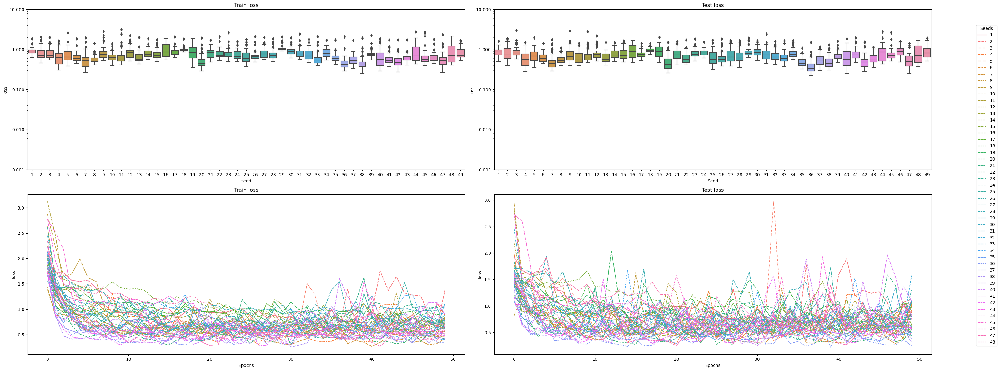

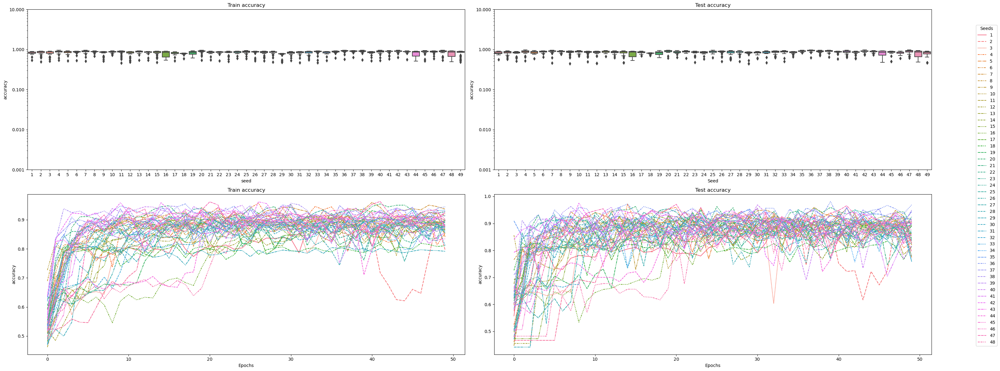

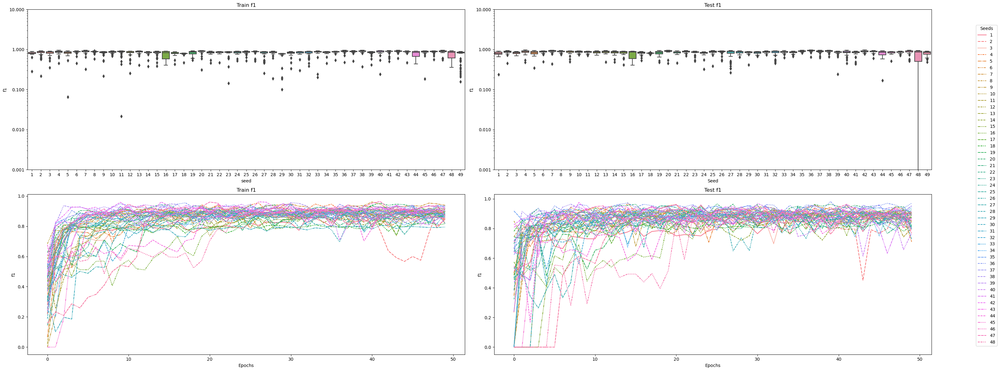

In [13]:
plot_stats(seeds_dict, "loss")
plot_stats(seeds_dict, "accuracy")
plot_stats(seeds_dict, "f1")

### OR dataset

In [14]:
seeds_dict = seeds_training(n_seeds=50, dataset="continous_or")

Loaded seeds_dict_lr_1e-1_continous_or.pkl


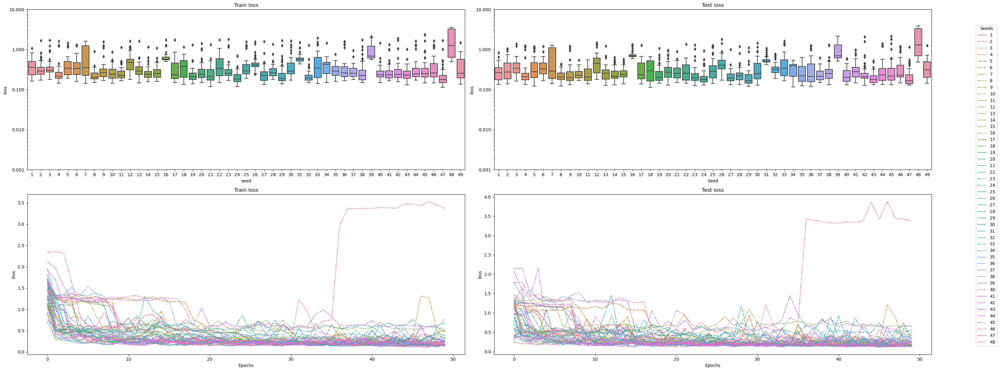

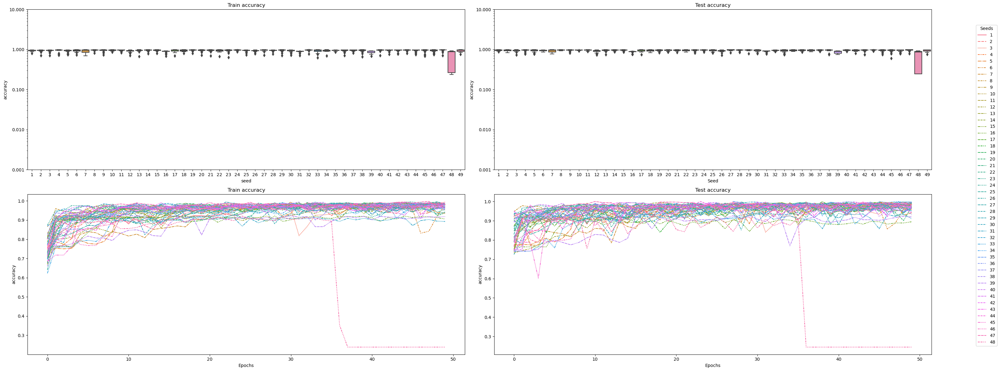

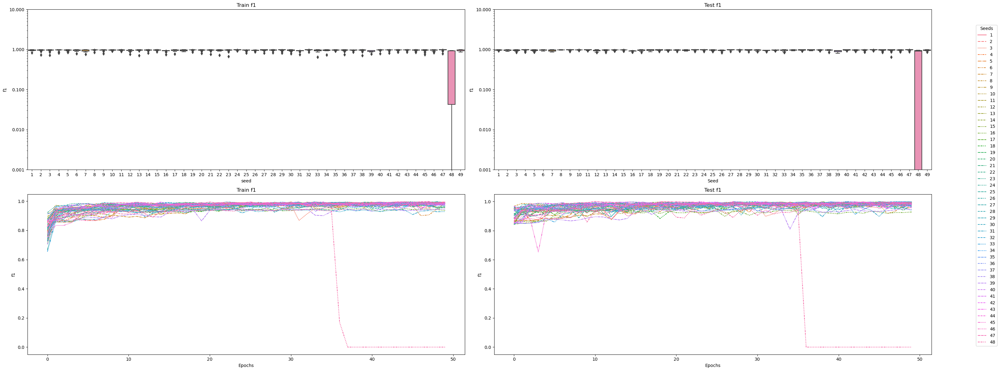

In [15]:
plot_stats(seeds_dict, "loss")
plot_stats(seeds_dict, "accuracy")
plot_stats(seeds_dict, "f1")

### And dataset

In [16]:
seeds_dict = seeds_training(n_seeds=50, dataset="continous_and")

Loaded seeds_dict_lr_1e-1_continous_and.pkl


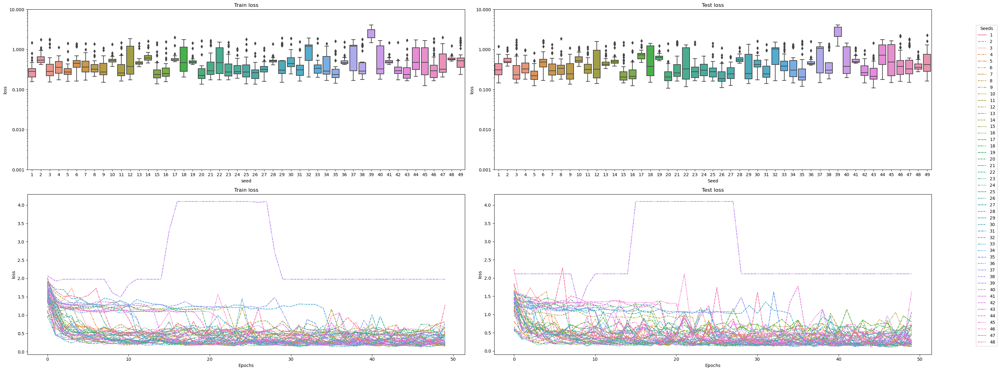

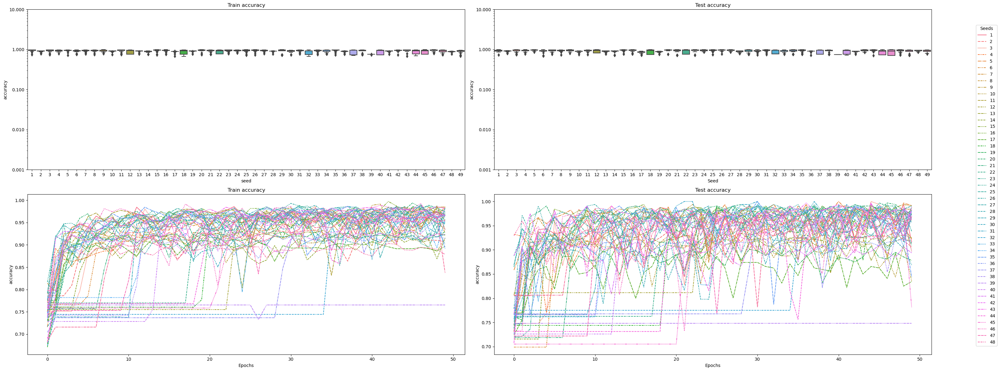

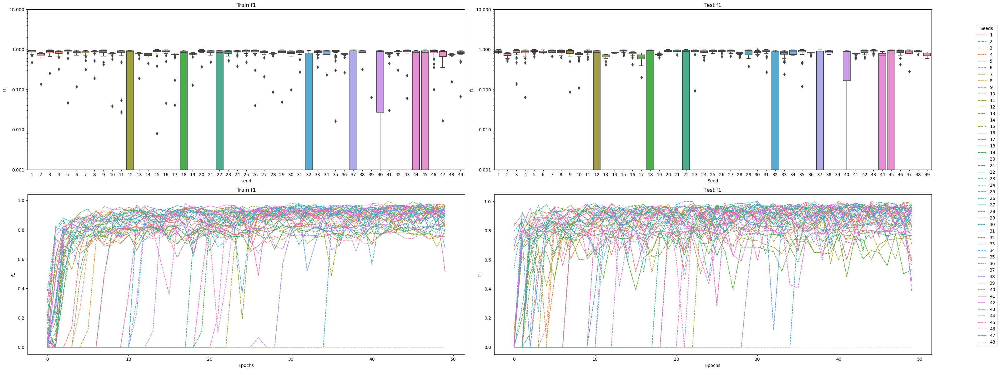

In [17]:
plot_stats(seeds_dict, "loss")
plot_stats(seeds_dict, "accuracy")
plot_stats(seeds_dict, "f1")